# Additional Model - Dinov3-CovNeXt-Tiny

Training + evaluation notebook for an additional model: Dinov3-ConvNeXt-tiny.

## Colab Setup

Run these when using Colab: mounts Drive, moves to repo, install dependencies from `requirements.txt`, and loads W&B auth from Colab Secrets (see README if not setup).

In [1]:
# # # # Colab only: mount Drive and move into the repo.
# from google.colab import drive

# drive.mount("/content/drive")
# %cd /content/drive/MyDrive/Deep Learning Project/DLE-Flair-Segmentation

In [2]:
# pip install -r requirements.txt

In [3]:
# # # Colab only: load W&B API key from Colab Secrets.
# # # In Colab, add a secret named exactly WANDB_API_KEY before running this cell.
# import os
# from google.colab import userdata

# wandb_api_key = userdata.get("WANDB_API_KEY")
# if wandb_api_key:
#     os.environ["WANDB_API_KEY"] = wandb_api_key
#     print("WANDB_API_KEY loaded from Colab Secrets.")
# else:
#     print("WANDB_API_KEY was not found in Colab Secrets; W&B training will fail if enabled.")

## Local Setup

Start here when local. In Colab, run this section **after** the Colab setup above.

In [4]:
from pathlib import Path
import os
import sys

NOTEBOOK_DIR = Path.cwd()
REPO_ROOT = NOTEBOOK_DIR if (NOTEBOOK_DIR / "src").exists() else NOTEBOOK_DIR.parent
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

print(f"Repo root: {REPO_ROOT}")

Repo root: /home/henry/Documents/Coursework/DLE_24788/final_project/DLE-Flair-Segmentation


In [5]:
import torch
import matplotlib.pyplot as plt

from src.data import build_dataloaders, load_class_map
from src.evaluate import evaluate_class_iou
from src.models import build_model, freeze_backbone
from src.train import (
    _load_env_file,
    build_loss,
    build_optimizer,
    build_scheduler,
    finish_wandb_run,
    sync_class_config,
    train_from_config,
    train_one_epoch,
    validate_one_epoch,
)
from src.utils import get_device, load_config
from src.visualize import plot_class_iou, plot_overlay_grid, plot_prediction_comparison_grid

device = get_device()
print(f"Using device: {device}")


Using device: cuda


## Load Config

Uses model specific `yaml` to override defaults for hyperparameters, model weights, architecture setups, etc.

In [6]:
config_path = REPO_ROOT / "configs" / "dinov3_convnext_tiny_3ch.yaml"
config = sync_class_config(load_config(config_path))

config

{'experiment': {'name': 'dinov3_convnext_tiny_3ch_val_IoU',
  'seed': 42,
  'output_dir': 'outputs'},
 'data': {'train_csv': 'data/processed/splits/train.csv',
  'val_csv': 'data/processed/splits/val.csv',
  'test_csv': 'data/processed/splits/test.csv',
  'class_map': 'data/processed/class_map.json',
  'train_stats': 'data/processed/train_stats.json',
  'image_size': 512,
  'batch_size': 8,
  'num_workers': 0,
  'channels': [1, 2, 3],
  'norm_type': 'scaling',
  'norm_means': [],
  'norm_stds': [],
  'ignore_index': 255,
  'augment': {'enabled': True,
   'horizontal_flip': True,
   'vertical_flip': True,
   'random_rotate_90': True},
  'num_classes': 6},
 'model': {'name': 'dinov3_convnext_tiny',
  'encoder': 'dinov3_convnext_tiny',
  'pretrained': True,
  'in_channels': 3,
  'num_classes': 6},
 'training': {'max_epochs': 100,
  'min_epochs': 15,
  'warmup_frozen_epochs': 10,
  'early_stopping': {'enabled': True,
   'monitor': 'val_IoU',
   'mode': 'max',
   'patience': 25,
   'min_del

## W&B Auth Check

Local runs read `WANDB_API_KEY` from repo-root `.env`. Colab runs should load it from Colab Secrets in the setup cell above. This cell only reports whether a key is available; it never prints the key.

In [7]:
_load_env_file()
wandb_enabled = config.get("wandb", {}).get("enabled", False)
wandb_key_available = bool(os.environ.get("WANDB_API_KEY"))

print(f"W&B enabled in config: {wandb_enabled}")
print(f"WANDB_API_KEY available: {wandb_key_available}")
if wandb_enabled and not wandb_key_available:
    print("WARN: NOT LOGGED IN TO W&B.\nAdd WANDB_API_KEY to local .env or Colab Secrets before full training.")

W&B enabled in config: True
WANDB_API_KEY available: True


## Data Loading

In [8]:
train_loader, val_loader, test_loader = build_dataloaders(config["data"])
len(train_loader), len(val_loader), len(test_loader)

(25, 4, 4)

In [9]:
# sanity check dataloader output
def unpack_batch(batch):
    if isinstance(batch, dict):
        return batch["image"], batch["mask"]
    return batch

# get a single batch from the training dataloader and print shapes, dtypes, and value ranges
batch = next(iter(train_loader))
images, masks = unpack_batch(batch)

print("images", images.shape, images.dtype, images.min().item(), images.max().item())
print("masks ", masks.shape, masks.dtype, torch.unique(masks)[:20])

images torch.Size([8, 3, 512, 512]) torch.float32 0.0313725508749485 1.0
masks  torch.Size([8, 512, 512]) torch.int64 tensor([0, 1, 2, 3, 4, 5])


Visualization indices: [17, 12, 2, 0, 22, 20, 21, 6]


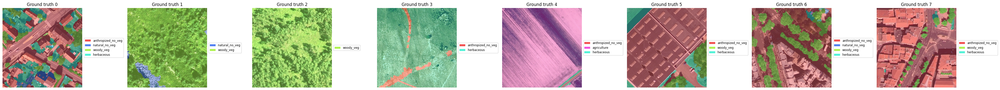

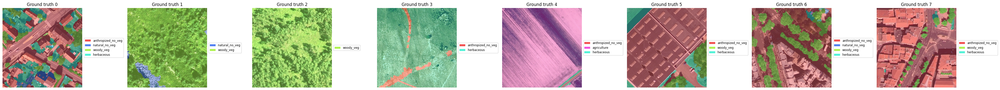

In [10]:
# load class map and get class names and ignore index for visualization
class_map = load_class_map(REPO_ROOT / config["data"]["class_map"])
class_names = class_map["class_names"]
ignore_index = config["data"].get("ignore_index", class_map.get("ignore_index", 255))

# visualize a few samples from the validation set with their ground truth masks
num_viz_items = 8
viz_generator = torch.Generator().manual_seed(config["experiment"]["seed"])
viz_indices = torch.randperm(len(val_loader.dataset), generator=viz_generator)[:num_viz_items].tolist()
viz_samples = [val_loader.dataset[index] for index in viz_indices]
viz_images = torch.stack([sample["image"] for sample in viz_samples])
viz_masks = torch.stack([sample["mask"] for sample in viz_samples])

print(f"Visualization indices: {viz_indices}")
gt_overlay_fig = plot_overlay_grid(
    viz_images,
    viz_masks,
    max_items=num_viz_items,
    title="Ground truth",
    class_names=class_names,
    ignore_index=ignore_index,
)
gt_overlay_fig


## Model, Loss, Optimizer

In [11]:
# build model and loss function
model = build_model(config["model"]).to(device)
loss_fn = build_loss(config["training"]["loss"], device)

# optionally freeze backbone layers for few warmup epochs, then unfreeze before main training loop
warmup_frozen_epochs = config["training"].get("warmup_frozen_epochs", 0)
if warmup_frozen_epochs > 0:
    freeze_backbone(model)

# build optimizer and scheduler
optimizer = build_optimizer(model, config["training"]["optimizer"])
scheduler = build_scheduler(
    optimizer,
    config["training"]["scheduler"],
    config["training"]["max_epochs"],
)

# sanity check model name
print(model.__class__.__name__)
print([group["name"] for group in optimizer.param_groups])

Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

DinoV3SegmentationModel
['head']


In [12]:
# Forward-pass smoke test
model.eval()
with torch.no_grad():
    sample_logits = model(images[:2].to(device))

print("logits", sample_logits.shape)
assert sample_logits.shape[1] == config["model"]["num_classes"]
assert sample_logits.shape[-2:] == images.shape[-2:]

logits torch.Size([2, 6, 512, 512])


## Single-Batch Verification

Optional. Uncomment when you want to verify one train step and one validation pass. This mutates model weights, so restart the kernel before real training.

In [13]:
# train_metrics = train_one_epoch(model, [batch], loss_fn, optimizer, device, epoch=1)
# val_metrics = validate_one_epoch(
#     model,
#     [batch],
#     loss_fn,
#     config["data"]["num_classes"],
#     config["data"].get("ignore_index", 255),
#     device,
# )
# train_metrics, val_metrics

## Full Training
Checkpoints will be saved under `outputs/resnet34_unet/`.

In [14]:
result = train_from_config(config_path)
result

Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: Appending key for api.wandb.ai to your netrc file: /home/henry/.netrc
wandb: Currently logged in as: hfeldhau (flair-segmentation-dle) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Evaluating: 100%|██████████| 4/4 [00:00<00:00,  7.36it/s]                


epoch 001 train_loss=1.4095 val_loss=1.0457 val_IoU=0.4062 val_IoU=0.4062


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.72it/s]                 


epoch 002 train_loss=1.1724 val_loss=0.9409 val_IoU=0.5568 val_IoU=0.5568


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.52it/s]                 


epoch 003 train_loss=1.1267 val_loss=0.9035 val_IoU=0.5784 val_IoU=0.5784


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.62it/s]                 


epoch 004 train_loss=1.0232 val_loss=0.8402 val_IoU=0.6087 val_IoU=0.6087


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.46it/s]                 


epoch 005 train_loss=1.0363 val_loss=0.8418 val_IoU=0.6051 val_IoU=0.6051


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.36it/s]                 


epoch 006 train_loss=0.9741 val_loss=0.8066 val_IoU=0.6295 val_IoU=0.6295


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.05it/s]                 


epoch 007 train_loss=0.9340 val_loss=0.7966 val_IoU=0.6284 val_IoU=0.6284


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 15.81it/s]                 


epoch 008 train_loss=0.9511 val_loss=0.8439 val_IoU=0.6115 val_IoU=0.6115


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.96it/s]                 


epoch 009 train_loss=0.9176 val_loss=0.8503 val_IoU=0.6290 val_IoU=0.6290


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.52it/s]                  


epoch 010 train_loss=0.9288 val_loss=0.8675 val_IoU=0.6184 val_IoU=0.6184


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.42it/s]                  


epoch 011 train_loss=1.0935 val_loss=1.0732 val_IoU=0.4386 val_IoU=0.4386


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.71it/s]                  


epoch 012 train_loss=1.0512 val_loss=0.9102 val_IoU=0.4969 val_IoU=0.4969


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.39it/s]                  


epoch 013 train_loss=1.0088 val_loss=0.9407 val_IoU=0.4634 val_IoU=0.4634


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.30it/s]                  


epoch 014 train_loss=0.9679 val_loss=0.7724 val_IoU=0.5133 val_IoU=0.5133


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.77it/s]                  


epoch 015 train_loss=0.9201 val_loss=0.6804 val_IoU=0.6304 val_IoU=0.6304


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.64it/s]                  


epoch 016 train_loss=0.8778 val_loss=0.8430 val_IoU=0.6131 val_IoU=0.6131


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.50it/s]                  


epoch 017 train_loss=0.8637 val_loss=0.7977 val_IoU=0.6420 val_IoU=0.6420


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.72it/s]                  


epoch 018 train_loss=0.8018 val_loss=0.7457 val_IoU=0.6299 val_IoU=0.6299


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.20it/s]                  


epoch 019 train_loss=0.8102 val_loss=0.7354 val_IoU=0.6267 val_IoU=0.6267


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.21it/s]                  


epoch 020 train_loss=0.7792 val_loss=0.7892 val_IoU=0.6299 val_IoU=0.6299


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.49it/s]                  


epoch 021 train_loss=0.7775 val_loss=0.7679 val_IoU=0.6254 val_IoU=0.6254


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.05it/s]                  


epoch 022 train_loss=0.7854 val_loss=0.8974 val_IoU=0.6344 val_IoU=0.6344


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.51it/s]                  


epoch 023 train_loss=0.7538 val_loss=0.7703 val_IoU=0.6208 val_IoU=0.6208


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.02it/s]                  


epoch 024 train_loss=0.7520 val_loss=0.7042 val_IoU=0.6444 val_IoU=0.6444


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.03it/s]                  


epoch 025 train_loss=0.7575 val_loss=0.8354 val_IoU=0.5762 val_IoU=0.5762


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.35it/s]                  


epoch 026 train_loss=0.7638 val_loss=0.7864 val_IoU=0.5637 val_IoU=0.5637


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.74it/s]                  


epoch 027 train_loss=0.7515 val_loss=0.7793 val_IoU=0.6481 val_IoU=0.6481


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.65it/s]                  


epoch 028 train_loss=0.7447 val_loss=0.7176 val_IoU=0.6355 val_IoU=0.6355


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.10it/s]                  


epoch 029 train_loss=0.7363 val_loss=0.7386 val_IoU=0.6387 val_IoU=0.6387


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.22it/s]                  


epoch 030 train_loss=0.7296 val_loss=0.7130 val_IoU=0.6182 val_IoU=0.6182


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.10it/s]                  


epoch 031 train_loss=0.7394 val_loss=0.6993 val_IoU=0.6378 val_IoU=0.6378


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.84it/s]                  


epoch 032 train_loss=0.7239 val_loss=0.7278 val_IoU=0.6259 val_IoU=0.6259


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.72it/s]                  


epoch 033 train_loss=0.7221 val_loss=0.8272 val_IoU=0.6298 val_IoU=0.6298


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.10it/s]                  


epoch 034 train_loss=0.7161 val_loss=0.7243 val_IoU=0.6372 val_IoU=0.6372


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.15it/s]                  


epoch 035 train_loss=0.7210 val_loss=0.6683 val_IoU=0.6325 val_IoU=0.6325


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.04it/s]                  


epoch 036 train_loss=0.6954 val_loss=0.7148 val_IoU=0.6456 val_IoU=0.6456


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.77it/s]                  


epoch 037 train_loss=0.6986 val_loss=0.7037 val_IoU=0.6661 val_IoU=0.6661


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.85it/s]                  


epoch 038 train_loss=0.6982 val_loss=0.6856 val_IoU=0.6474 val_IoU=0.6474


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.43it/s]                  


epoch 039 train_loss=0.7101 val_loss=0.7473 val_IoU=0.6311 val_IoU=0.6311


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.03it/s]                  


epoch 040 train_loss=0.6989 val_loss=0.6802 val_IoU=0.6286 val_IoU=0.6286


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.86it/s]                  


epoch 041 train_loss=0.6896 val_loss=0.7194 val_IoU=0.6283 val_IoU=0.6283


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.77it/s]                  


epoch 042 train_loss=0.6866 val_loss=0.7810 val_IoU=0.6386 val_IoU=0.6386


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.49it/s]                  


epoch 043 train_loss=0.6808 val_loss=0.9051 val_IoU=0.6352 val_IoU=0.6352


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.46it/s]                  


epoch 044 train_loss=0.6825 val_loss=0.7652 val_IoU=0.6493 val_IoU=0.6493


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.40it/s]                  


epoch 045 train_loss=0.7032 val_loss=0.7464 val_IoU=0.6442 val_IoU=0.6442


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.38it/s]                  


epoch 046 train_loss=0.6868 val_loss=0.7700 val_IoU=0.6651 val_IoU=0.6651


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.53it/s]                  


epoch 047 train_loss=0.6799 val_loss=0.7121 val_IoU=0.6331 val_IoU=0.6331


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.21it/s]                  


epoch 048 train_loss=0.6730 val_loss=0.7083 val_IoU=0.6541 val_IoU=0.6541


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.83it/s]                  


epoch 049 train_loss=0.6745 val_loss=0.8005 val_IoU=0.6642 val_IoU=0.6642


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.94it/s]                  


epoch 050 train_loss=0.6861 val_loss=0.7446 val_IoU=0.6395 val_IoU=0.6395


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.10it/s]                  


epoch 051 train_loss=0.6651 val_loss=0.7969 val_IoU=0.6370 val_IoU=0.6370


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.99it/s]                  


epoch 052 train_loss=0.6645 val_loss=0.7882 val_IoU=0.6341 val_IoU=0.6341


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.34it/s]                  


epoch 053 train_loss=0.6605 val_loss=0.7489 val_IoU=0.6438 val_IoU=0.6438


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.36it/s]                  


epoch 054 train_loss=0.6654 val_loss=0.7318 val_IoU=0.6384 val_IoU=0.6384


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.29it/s]                  


epoch 055 train_loss=0.6701 val_loss=0.6535 val_IoU=0.6591 val_IoU=0.6591


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 15.61it/s]                  


epoch 056 train_loss=0.6705 val_loss=0.7180 val_IoU=0.6452 val_IoU=0.6452


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.15it/s]                  


epoch 057 train_loss=0.6657 val_loss=0.8238 val_IoU=0.6331 val_IoU=0.6331


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.17it/s]                  


epoch 058 train_loss=0.6554 val_loss=0.7323 val_IoU=0.6683 val_IoU=0.6683


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.91it/s]                  


epoch 059 train_loss=0.6676 val_loss=0.6708 val_IoU=0.6680 val_IoU=0.6680


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.77it/s]                  


epoch 060 train_loss=0.6492 val_loss=0.6920 val_IoU=0.6526 val_IoU=0.6526


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.21it/s]                  


epoch 061 train_loss=0.6489 val_loss=0.7344 val_IoU=0.6437 val_IoU=0.6437


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.67it/s]                  


epoch 062 train_loss=0.6615 val_loss=0.7157 val_IoU=0.6378 val_IoU=0.6378


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.37it/s]                  


epoch 063 train_loss=0.6415 val_loss=0.7233 val_IoU=0.6466 val_IoU=0.6466


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.18it/s]                  


epoch 064 train_loss=0.6453 val_loss=0.7905 val_IoU=0.6434 val_IoU=0.6434


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.11it/s]                  


epoch 065 train_loss=0.6472 val_loss=0.7324 val_IoU=0.6430 val_IoU=0.6430


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.59it/s]                  


epoch 066 train_loss=0.6494 val_loss=0.7951 val_IoU=0.6429 val_IoU=0.6429


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.28it/s]                  


epoch 067 train_loss=0.6501 val_loss=0.7895 val_IoU=0.6359 val_IoU=0.6359


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.19it/s]                  


epoch 068 train_loss=0.6546 val_loss=0.7074 val_IoU=0.6509 val_IoU=0.6509


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.24it/s]                  


epoch 069 train_loss=0.6426 val_loss=0.7354 val_IoU=0.6519 val_IoU=0.6519


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 18.18it/s]                  


epoch 070 train_loss=0.6396 val_loss=0.8620 val_IoU=0.6412 val_IoU=0.6412


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.49it/s]                  


epoch 071 train_loss=0.6442 val_loss=0.7541 val_IoU=0.6430 val_IoU=0.6430


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.42it/s]                  


epoch 072 train_loss=0.6330 val_loss=0.7405 val_IoU=0.6444 val_IoU=0.6444


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.02it/s]                  


epoch 073 train_loss=0.6336 val_loss=0.7309 val_IoU=0.6491 val_IoU=0.6491


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 17.29it/s]                  


epoch 074 train_loss=0.6362 val_loss=0.7311 val_IoU=0.6536 val_IoU=0.6536


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.56it/s]                  


epoch 075 train_loss=0.6398 val_loss=0.8193 val_IoU=0.6439 val_IoU=0.6439


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.57it/s]                  


epoch 076 train_loss=0.6274 val_loss=0.7962 val_IoU=0.6442 val_IoU=0.6442


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.91it/s]                  


epoch 077 train_loss=0.6297 val_loss=0.8250 val_IoU=0.6463 val_IoU=0.6463


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.88it/s]                  


epoch 078 train_loss=0.6383 val_loss=0.7839 val_IoU=0.6412 val_IoU=0.6412


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.17it/s]                  


epoch 079 train_loss=0.6409 val_loss=0.7705 val_IoU=0.6422 val_IoU=0.6422


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.50it/s]                  


epoch 080 train_loss=0.6409 val_loss=0.8391 val_IoU=0.6414 val_IoU=0.6414


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.62it/s]                  


epoch 081 train_loss=0.6330 val_loss=0.7653 val_IoU=0.6451 val_IoU=0.6451


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.44it/s]                  


epoch 082 train_loss=0.6269 val_loss=0.7787 val_IoU=0.6419 val_IoU=0.6419


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 16.60it/s]                  


epoch 083 train_loss=0.6265 val_loss=0.7738 val_IoU=0.6454 val_IoU=0.6454
Early stopping at epoch 83. Best epoch: 58.


{'output_dir': PosixPath('outputs/dinov3_convnext_tiny_3ch_val_IoU'),
 'best_epoch': 58,
 'best_metric': 0.6683201789855957,
 'history': [{'epoch': 1,
   'train_loss': 1.409452748298645,
   'val_loss': 1.0457261949777603,
   'val_IoU': 0.4062458574771881,
   'head_lr': 0.0001,
   'best_val_IoU': 0.4062458574771881,
   'best_val_IoU_epoch': 1},
  {'epoch': 2,
   'train_loss': 1.1724307441711426,
   'val_loss': 0.9409431666135788,
   'val_IoU': 0.5568158030509949,
   'head_lr': 9.997532801828658e-05,
   'best_val_IoU': 0.5568158030509949,
   'best_val_IoU_epoch': 2},
  {'epoch': 3,
   'train_loss': 1.126723575592041,
   'val_loss': 0.9035345613956451,
   'val_IoU': 0.5784496068954468,
   'head_lr': 9.990133642141359e-05,
   'best_val_IoU': 0.5784496068954468,
   'best_val_IoU_epoch': 3},
  {'epoch': 4,
   'train_loss': 1.0232147669792175,
   'val_loss': 0.8401658236980438,
   'val_IoU': 0.6087120771408081,
   'head_lr': 9.977809823015401e-05,
   'best_val_IoU': 0.6087120771408081,
   'be

## Visualize Predictions

Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

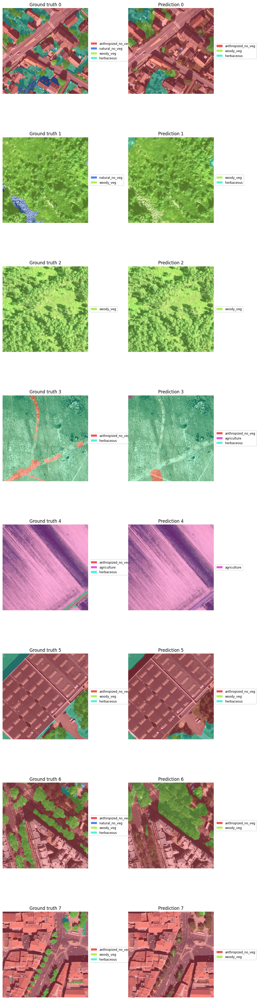

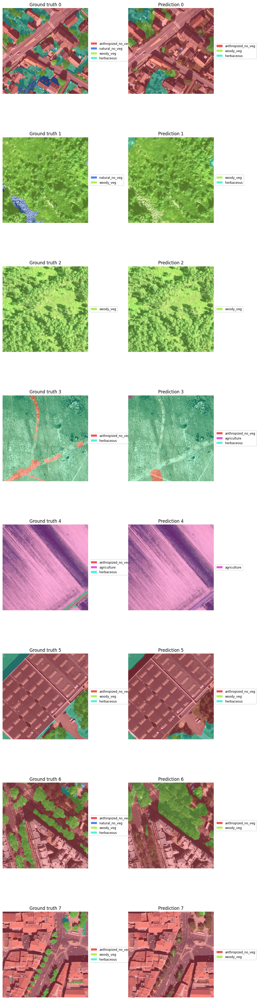

In [15]:
checkpoint_path = result["output_dir"] / "best.pt"
if not checkpoint_path.exists():
    raise FileNotFoundError(f"Best checkpoint not found: {checkpoint_path}")

# load the best checkpoint for visualization
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
prediction_model = build_model(config["model"]).to(device)
prediction_model.load_state_dict(checkpoint["model_state_dict"])
prediction_model.eval()

# get predictions for visualization samples
with torch.no_grad():
    viz_logits = prediction_model(viz_images.to(device)).cpu()

# create prediction overlay figures
prediction_comparison_fig = plot_prediction_comparison_grid(
    viz_images,
    viz_masks,
    viz_logits,
    max_items=num_viz_items,
    class_names=class_names,
    ignore_index=ignore_index,
)

# log prediction overlays to W&B if enabled
if config.get("wandb", {}).get("enabled", False) and config.get("wandb", {}).get("include_images", False):
    import wandb

    step = result["history"][-1]["epoch"] if result.get("history") else None
    result["run"].log({"prediction_comparison": wandb.Image(prediction_comparison_fig)}, step=step)

# show prediction overlay figure
prediction_comparison_fig


## Best Checkpoint Class IoU

Evaluating class IoU: 100%|██████████| 4/4 [00:00<00:00, 13.28it/s]


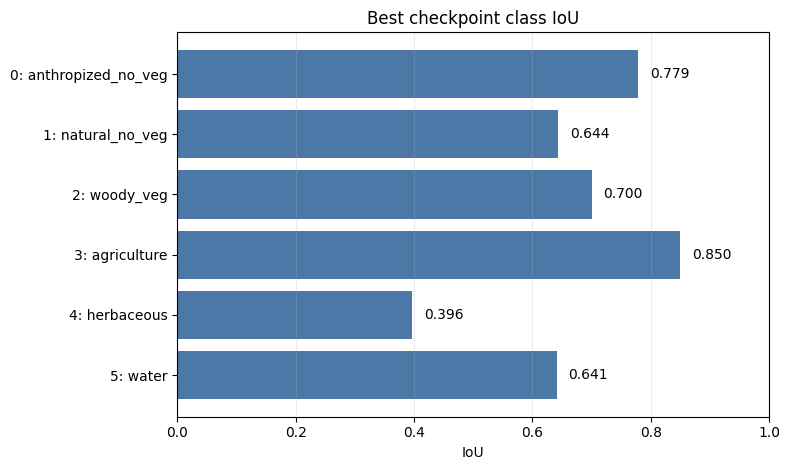

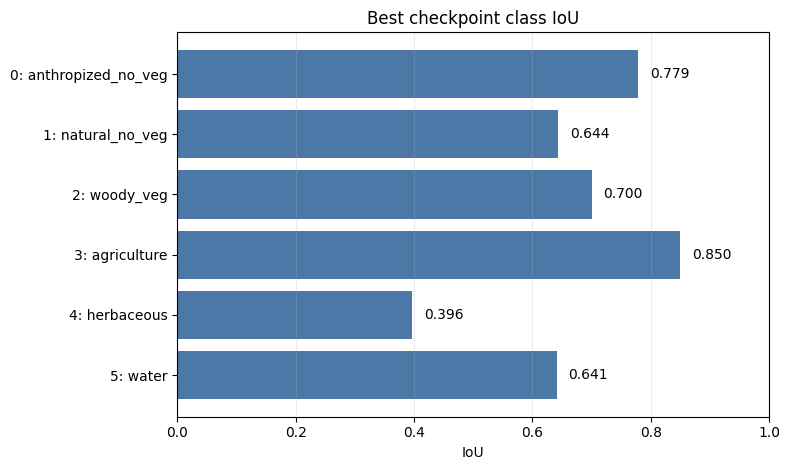

In [16]:
best_class_iou = evaluate_class_iou(
    prediction_model,
    val_loader,
    config["data"]["num_classes"],
    device,
    ignore_index=ignore_index,
    class_names=class_names,
)
best_class_iou_metrics = {
    f"best_val_iou_class_{class_id}": iou
    for class_id, iou in best_class_iou["class_iou"].items()
}
best_class_iou_fig = plot_class_iou(best_class_iou)

if result.get("run") is not None:
    import wandb

    result["run"].log(
        {
            **best_class_iou_metrics,
            "best_class_iou": wandb.Image(best_class_iou_fig),
        },
        step=result["best_epoch"],
    )

best_class_iou_fig


Closes W&B Run after all artifacts uploaded.

In [17]:
finish_wandb_run(result.get("run"))

backbone_lr,██████████▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁
best_val_IoU,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████████████████
best_val_IoU_epoch,▁▁▁▁▁▁▁▁▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅█████████████
epoch,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
head_lr,██████████▇▇▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁
train_loss,██▇▇▆▇▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁
val_IoU,▁▄▅▄▅▅▆▆▅▆▆▂▇▆▆▆▅▆▆▆█▆▅▆▇▇█▆▆▇▆█▇▆▆▆▆▆▆▇
val_loss,▆▅▄▃▄█▅▆▁▃▂▃▃▃▃▂▄▂▂▁▁▂▅▃▂▂▃▂▃▂▄▂▁▁▂▃▃▂▄▃
backbone_lr,0.0
epoch,83
head_lr,1e-05
